In [354]:
import pandas as pd

In [355]:
# Import the titanic csv 
titanic_df = pd.read_csv("titanic.csv")
titanic_df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [356]:
# Check the data types
titanic_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [357]:
# Drop unnecessary data
titanic_df.drop(["Cabin", "Name", "Ticket", "SibSp", "Parch"], axis=1, inplace=True)

### One-Hot Encoding
One-hot encoding is a technique used to ensure that categorical variables are better represented in the machine. Let's take a look at the "Sex" column

In [358]:
# List unique values in Sex column
titanic_df["Sex"].unique()

array(['male', 'female'], dtype=object)

Machine Learning classifiers don't know how to handle strings. As a result, you need to convert it into a categorical representation. There are two main ways to go about this:

Label Encoding: Assigning, for example, 0 for "male" and 1 for "female". The problem here is it intrinsically makes one category "larger than" the other category.

One-hot encoding: Assigning, for example, [1, 0] for "male" and [0, 1] for female. In this case, you have an array of size (n_categories,) and you represent a 1 in the correct index, and 0 elsewhere. In Pandas, this would show as extra columns. For example, rather than having a "Sex" column, it would be a "Sex_male" and "Sex_female" column. Then, if the person is male, it would simply show as a 1 in the "Sex_male" column and a 0 in the "Sex_female" column.

There is a nice and easy method that does this in pandas: get_dummies()

In [359]:
# Use get_dummies to change sex to binary data
titanic_df = pd.get_dummies(titanic_df, prefix="Sex", columns=["Sex"], dtype=int)
titanic_df.head()

,PassengerId,Survived,Pclass,Age,Fare,Embarked,Sex_female,Sex_male
0,1,0,3,22.0,7.2500,S,0,1
1,2,1,1,38.0,71.2833,C,1,0
2,3,1,3,26.0,7.9250,S,1,0
3,4,1,1,35.0,53.1000,S,1,0
4,5,0,3,35.0,8.0500,S,0,1


Now, we do the same to the "Embarked" column.

In [360]:
# Use get_dummies to change Embarked to binary data
titanic_df = pd.get_dummies(titanic_df, prefix="Embarked", columns=["Embarked"], dtype=int)
titanic_df.head()

,PassengerId,Survived,Pclass,Age,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,1,0,3,22.0,7.2500,0,1,0,0,1
1,2,1,1,38.0,71.2833,1,0,1,0,0
2,3,1,3,26.0,7.9250,1,0,0,0,1
3,4,1,1,35.0,53.1000,1,0,0,0,1
4,5,0,3,35.0,8.0500,0,1,0,0,1


In [361]:
# Import train_test_split and Decision tree model functions
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

In [362]:
# Define independent and dependent variables 
X = titanic_df.loc[:, ['Pclass', 'Age', 'Sex_female']].values
y = titanic_df.loc[:,'Survived'].values

# Split the original dataset into training and test sets
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y,
test_size=0.2, random_state=42)
# Split the training set further into training and development sets
X_train, X_dev, y_train, y_dev = train_test_split(X_train_full,
y_train_full, test_size=0.2, random_state=42)

In [363]:
# Training a model without pruning
unpruned = DecisionTreeClassifier(max_depth=None)
unpruned.fit(X_train, y_train)

DecisionTreeClassifier()

In [364]:
# Import functions for visualisation
import matplotlib.pyplot as plt
from sklearn.tree import export_graphviz
from IPython.display import Image  
from subprocess import call

In [365]:
# Use graphviz to create decision tree visualisation
export_graphviz(unpruned, out_file='no_max_tree.dot', feature_names=['PClass', 'Age', 'Female?'], rounded = True, proportion = False, precision = 2, filled = True)
  
# Convert to png using system command
call(['dot', '-Tpng', 'no_max_tree.dot', '-o', 'no_max_tree.png', '-Gdpi=600'])

# Show image of decision tree
Image(filename = 'no_max_tree.png', width=500)

In [366]:
# Calculate and print accuracy of the model on development set
print("Performance without pruning on development data set:", unpruned.score(X_dev, y_dev))

Performance without pruning on development data set: 0.8461538461538461


In [367]:
# Define a function to return visualisation of decision trees of varying depths
def tree_plot(d):
    export_graphviz(pruned, out_file=f'max{d}_tree.dot', feature_names=['PClass', 'Age', 'Female?'], rounded = True, proportion = False, precision = 2, filled = True)
  
    # Convert to png using system command
    call(['dot', '-Tpng', f'max{d}_tree.dot', '-o', f'max{d}_tree.png', '-Gdpi=600'])

    return(Image(filename = f'max{d}_tree.png', width=400))

In [368]:
# Create a loop to create decision trees of varying depths
for d in range(2,11):
  pruned = DecisionTreeClassifier(max_depth=d, random_state=42) # Train the model
  pruned.fit(X_train, y_train)  # Fit the data
  tree_plot(d)  # Run the tree_plot function

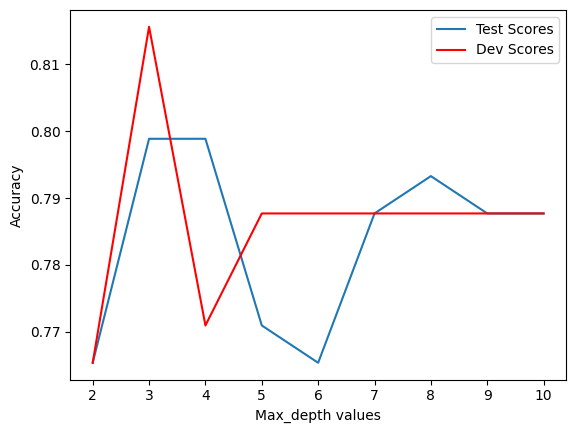

In [369]:
# Looking at effect of pruning at depths 2-10
pruned_depths = range(2,11)

# Create a list to append test scores from training data
pruned_scores_test = [] 

# Create a loop to calculate and append accuracy scores
for d in pruned_depths:
  clf = DecisionTreeClassifier(max_depth=d, random_state=42)  # Train the model
  clf.fit(X_train, y_train)         # Fit the data
  score = clf.score(X_test, y_test) # Calculate accuracy scores
  pruned_scores_test.append(score)  # Append to list

# Creat list to append test scores from dev data
pruned_scores_dev = [] 
for d in pruned_depths:
  clf = DecisionTreeClassifier(max_depth=d, random_state=42)  # Train the model
  clf.fit(X_dev, y_dev)             # Fit the data
  score = clf.score(X_test, y_test) # Calculate accuracy scores
  pruned_scores_dev.append(score)   # Append to list

# Create a plot for visualisation
fig, ax = plt.subplots()
line1, = ax.plot(pruned_depths, pruned_scores_test, label='Test Scores')  # Plot depth against accuracy score for test data
line2, = ax.plot(pruned_depths, pruned_scores_dev, color='red', label ='Dev Scores')  # # Plot depth against accuracy score for dev data
# Label axes and create legend
plt.xlabel("Max_depth values")
plt.ylabel("Accuracy")
ax.legend(handles=[line1, line2])
ax.xaxis.set_ticks(pruned_depths)
plt.show()

As we can see from the plot above the accuracies of both the test and development sets at increasing depths of the model oscillates about the final accuracy value of just below 0.79 achieved at depths of level 5 or above on the development scores and level 9+ for the test scores. We can also see that our accuracies for both sets of data are highest at a depth of 3 levels. This means that as more variables are included in the decision tree accuracy falls and then rises again as more data is included in the model until we reach a point where the accuracy is stable.

In [370]:
# Calculate and print accuracy of the model on test set
print("Performance without pruning on test data set:", unpruned.score(X_test, y_test))

Performance without pruning on test data set: 0.7932960893854749
